In [1]:
import numpy as np
from sklearn.decomposition import PCA
import pandas as pd
import plotly.express as px
import plotly.io as pio
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import plotly.graph_objects as go
import math
from plotly.subplots import make_subplots


pio.renderers.default = 'vscode'
pio.templates.default = 'plotly'

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier


from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score, roc_curve, auc
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import label_binarize


import plotly.figure_factory as ff

import json
import geopandas

ModuleNotFoundError: No module named 'geopandas'

In [ ]:
jsonGeoNeigh = json.load(open("../Data/neighbourhoods/neighbourhoods.geojson"))

# No Correr

In [2]:
NYC_crime_df = pd.read_csv("../Data/NYC/NYPD_Complaint_Data_Historic.csv",low_memory=False)

In [3]:
NYC_crime_df.head()

,CMPLNT_NUM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,ADDR_PCT_CD,RPT_DT,KY_CD,OFNS_DESC,PD_CD,...,SUSP_SEX,TRANSIT_DISTRICT,Latitude,Longitude,Lat_Lon,PATROL_BORO,STATION_NAME,VIC_AGE_GROUP,VIC_RACE,VIC_SEX
0,506547392,03/29/2018,20:30:00,NaN,NaN,32.0,03/30/2018,351,CRIMINAL MISCHIEF & RELATED OF,254.0,...,NaN,NaN,40.810877,-73.941064,"(40.810877241, -73.941064151)",PATROL BORO MAN NORTH,NaN,25-44,WHITE,F
1,629632833,02/06/2018,23:15:00,NaN,NaN,52.0,02/07/2018,341,PETIT LARCENY,333.0,...,F,NaN,40.873671,-73.908014,"(40.873671035, -73.908013649)",PATROL BORO BRONX,NaN,UNKNOWN,UNKNOWN,D
2,787203902,11/21/2018,00:15:00,11/21/2018,00:20:00,75.0,11/21/2018,341,PETIT LARCENY,321.0,...,F,NaN,40.651782,-73.885457,"(40.651782232, -73.885456761)",PATROL BORO BKLYN NORTH,NaN,UNKNOWN,UNKNOWN,D
3,280364018,06/09/2018,21:42:00,06/09/2018,21:43:00,10.0,06/10/2018,361,OFF. AGNST PUB ORD SENSBLTY &,639.0,...,M,NaN,40.759310,-73.994706,"(40.759310399, -73.994706072)",PATROL BORO MAN SOUTH,NaN,18-24,WHITE HISPANIC,F
4,985800320,11/10/2018,19:40:00,11/10/2018,19:45:00,19.0,11/10/2018,341,PETIT LARCENY,333.0,...,F,NaN,40.764536,-73.970728,"(40.764535539, -73.970728388)",PATROL BORO MAN NORTH,NaN,UNKNOWN,UNKNOWN,D


In [4]:
NYC_crime_df["Latitude"].dtypes

dtype('float64')

In [5]:
from datetime import date, datetime
NYC_crime_df["CMPLNT_FR_DT"] = pd.to_datetime(NYC_crime_df["CMPLNT_FR_DT"], errors='coerce')

NYC_crime_df = NYC_crime_df[NYC_crime_df["CMPLNT_FR_DT"]>datetime(year=2021,month=1,day=1)]

In [6]:
len(NYC_crime_df.index)

438032

In [7]:
NYC_crime_df.groupby("OFNS_DESC",as_index=False).size().sort_values("size",ascending=False).head(40)

,OFNS_DESC,size
50,PETIT LARCENY,85137
25,HARRASSMENT 2,73744
5,ASSAULT 3 & RELATED OFFENSES,47971
9,CRIMINAL MISCHIEF & RELATED OF,43764
23,GRAND LARCENY,39069
17,FELONY ASSAULT,22552
39,OFF. AGNST PUB ORD SENSBLTY &,16730
34,MISCELLANEOUS PENAL LAW,14320
55,ROBBERY,13754
7,BURGLARY,12603


In [8]:
fig = px.histogram(data_frame=NYC_crime_df, x='CMPLNT_FR_DT')
fig.show()


In [9]:
offesnesList = ["HARRASSMENT 2","ASSAULT 3 & RELATED OFFENSES","CRIMINAL MISCHIEF & RELATED OF","FELONY ASSAULT","DANGEROUS DRUGS","SEX CRIMES","DANGEROUS WEAPONS","RAPE","MURDER & NON-NEGL. MANSLAUGHTER"]

In [10]:
NYC_selected_offenses = NYC_crime_df[NYC_crime_df["OFNS_DESC"].isin(offesnesList)]

In [11]:
len(NYC_selected_offenses.index)

208221

In [12]:
NYC_selected_offenses.to_parquet("../Data/NYC/NYPD_Complaint_2021_Now_Selected_Offenses.parquet")

# Correr desde aqui

In [ ]:
NYC_selected_offenses = pd.read_parquet("../Data/NYC Crime/NYPD_Complaint_2021_Now_Selected_Offenses.parquet")

In [ ]:
NYC_selected_offenses.groupby("OFNS_DESC",as_index=False).size().sort_values("size",ascending=False).head(40)

,OFNS_DESC,size
5,HARRASSMENT 2,73744
0,ASSAULT 3 & RELATED OFFENSES,47971
1,CRIMINAL MISCHIEF & RELATED OF,43764
4,FELONY ASSAULT,22552
2,DANGEROUS DRUGS,7655
8,SEX CRIMES,5654
3,DANGEROUS WEAPONS,5391
7,RAPE,1031
6,MURDER & NON-NEGL. MANSLAUGHTER,459


In [ ]:
geosonNeighbourhoods = geopandas.read_file("../Data/neighbourhoods/neighbourhoods.geojson")
geosonNeighbourhoods

,neighbourhood,neighbourhood_group,geometry
0,Bayswater,Queens,"MULTIPOLYGON (((-73.76671 40.61491, -73.76825 ..."
1,Allerton,Bronx,"MULTIPOLYGON (((-73.84860 40.87167, -73.84582 ..."
2,City Island,Bronx,"MULTIPOLYGON (((-73.78282 40.84392, -73.78257 ..."
3,Ditmars Steinway,Queens,"MULTIPOLYGON (((-73.90160 40.76777, -73.90391 ..."
4,Ozone Park,Queens,"MULTIPOLYGON (((-73.83754 40.69136, -73.83108 ..."
...,...,...,...
228,Westchester Square,Bronx,"MULTIPOLYGON (((-73.84294 40.84640, -73.83913 ..."
229,Westerleigh,Staten Island,"MULTIPOLYGON (((-74.13131 40.62633, -74.13192 ..."
230,Williamsbridge,Bronx,"MULTIPOLYGON (((-73.86722 40.86969, -73.86701 ..."
231,Williamsburg,Brooklyn,"MULTIPOLYGON (((-73.95757 40.72510, -73.95300 ..."


In [ ]:
geo_df_selected_offenses=geopandas.GeoDataFrame(NYC_selected_offenses,geometry= geopandas.points_from_xy(NYC_selected_offenses["Latitude"],NYC_selected_offenses["Longitude"]),crs="EPSG:4326")

In [ ]:
geo_df_selected_offenses.head()

,CMPLNT_NUM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,ADDR_PCT_CD,RPT_DT,KY_CD,OFNS_DESC,PD_CD,...,TRANSIT_DISTRICT,Latitude,Longitude,Lat_Lon,PATROL_BORO,STATION_NAME,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,geometry
681150,123171799,2021-12-31,21:15:00,NaN,NaN,43.0,12/31/2021,106,FELONY ASSAULT,109.0,...,NaN,40.817877,-73.865994,"(40.81787660100008, -73.86599391299995)",PATROL BORO BRONX,NaN,65+,BLACK,M,POINT (40.81788 -73.86599)
681311,143012852,2021-12-26,20:30:00,NaN,NaN,50.0,12/27/2021,344,ASSAULT 3 & RELATED OFFENSES,101.0,...,NaN,40.896652,-73.880524,"(40.89665184000006, -73.88052425099994)",PATROL BORO BRONX,NaN,25-44,WHITE HISPANIC,F,POINT (40.89665 -73.88052)
681613,829808403,2021-12-26,20:25:00,12/26/2021,20:57:00,20.0,12/26/2021,118,DANGEROUS WEAPONS,792.0,...,NaN,40.774164,-73.984881,"(40.77416407000004, -73.984880805)",PATROL BORO MAN NORTH,NaN,UNKNOWN,UNKNOWN,E,POINT (40.77416 -73.98488)
681853,321336708,2021-12-06,17:00:00,NaN,NaN,25.0,12/07/2021,351,CRIMINAL MISCHIEF & RELATED OF,258.0,...,NaN,40.798635,-73.939522,"(40.79863496300004, -73.93952191599993)",PATROL BORO MAN NORTH,NaN,UNKNOWN,UNKNOWN,E,POINT (40.79863 -73.93952)
681875,246003700,2021-12-08,11:20:00,12/08/2021,11:30:00,1.0,12/08/2021,344,ASSAULT 3 & RELATED OFFENSES,101.0,...,NaN,40.709532,-74.001668,"(40.70953164600007, -74.00166786599993)",PATROL BORO MAN SOUTH,NaN,25-44,WHITE,M,POINT (40.70953 -74.00167)


In [ ]:
#NYC_selected_offenses["geometry"] = geopandas.points_from_xy(NYC_selected_offenses["Latitude"],NYC_selected_offenses["Longitude"])

In [ ]:
NYC_selected_offenses.head()

,CMPLNT_NUM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,ADDR_PCT_CD,RPT_DT,KY_CD,OFNS_DESC,PD_CD,...,TRANSIT_DISTRICT,Latitude,Longitude,Lat_Lon,PATROL_BORO,STATION_NAME,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,geometry
681150,123171799,2021-12-31,21:15:00,NaN,NaN,43.0,12/31/2021,106,FELONY ASSAULT,109.0,...,NaN,40.817877,-73.865994,"(40.81787660100008, -73.86599391299995)",PATROL BORO BRONX,NaN,65+,BLACK,M,POINT (40.81788 -73.86599)
681311,143012852,2021-12-26,20:30:00,NaN,NaN,50.0,12/27/2021,344,ASSAULT 3 & RELATED OFFENSES,101.0,...,NaN,40.896652,-73.880524,"(40.89665184000006, -73.88052425099994)",PATROL BORO BRONX,NaN,25-44,WHITE HISPANIC,F,POINT (40.89665 -73.88052)
681613,829808403,2021-12-26,20:25:00,12/26/2021,20:57:00,20.0,12/26/2021,118,DANGEROUS WEAPONS,792.0,...,NaN,40.774164,-73.984881,"(40.77416407000004, -73.984880805)",PATROL BORO MAN NORTH,NaN,UNKNOWN,UNKNOWN,E,POINT (40.77416 -73.98488)
681853,321336708,2021-12-06,17:00:00,NaN,NaN,25.0,12/07/2021,351,CRIMINAL MISCHIEF & RELATED OF,258.0,...,NaN,40.798635,-73.939522,"(40.79863496300004, -73.93952191599993)",PATROL BORO MAN NORTH,NaN,UNKNOWN,UNKNOWN,E,POINT (40.79863 -73.93952)
681875,246003700,2021-12-08,11:20:00,12/08/2021,11:30:00,1.0,12/08/2021,344,ASSAULT 3 & RELATED OFFENSES,101.0,...,NaN,40.709532,-74.001668,"(40.70953164600007, -74.00166786599993)",PATROL BORO MAN SOUTH,NaN,25-44,WHITE,M,POINT (40.70953 -74.00167)


In [ ]:
import pygeos
geopandas.options.use_pygeos = False


In [ ]:

merged_df = geopandas.sjoin(geo_df_selected_offenses,geosonNeighbourhoods)
merged_df.head()

ImportError: Spatial indexes require either `rtree` or `pygeos`. See installation instructions at https://geopandas.org/install.html

In [ ]:
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon
from shapely.geometry import LineString, shape

geosonNeighbourhoods["geometryPolygon"] = (geosonNeighbourhoods["geometry"].length.coords)
geosonNeighbourhoods.head()

C:\Users\nacho\AppData\Local\Temp/ipykernel_27480/3440197617.py:5: UserWarning:

Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




AttributeError: 'Series' object has no attribute 'coords'

In [ ]:
geosonNeighbourhoods["geometry"].contains()

geopandas.geoseries.GeoSeries

In [ ]:
for indexGeo, rowGeo in geosonNeighbourhoods.iterrows():
    print(type(rowGeo["geometry"]))
    rowGeo["geometry"].contains()

<class 'shapely.geometry.multipolygon.MultiPolygon'>
<class 'shapely.geometry.multipolygon.MultiPolygon'>
<class 'shapely.geometry.multipolygon.MultiPolygon'>
<class 'shapely.geometry.multipolygon.MultiPolygon'>
<class 'shapely.geometry.multipolygon.MultiPolygon'>
<class 'shapely.geometry.multipolygon.MultiPolygon'>
<class 'shapely.geometry.multipolygon.MultiPolygon'>
<class 'shapely.geometry.multipolygon.MultiPolygon'>
<class 'shapely.geometry.multipolygon.MultiPolygon'>
<class 'shapely.geometry.multipolygon.MultiPolygon'>
<class 'shapely.geometry.multipolygon.MultiPolygon'>
<class 'shapely.geometry.multipolygon.MultiPolygon'>
<class 'shapely.geometry.multipolygon.MultiPolygon'>
<class 'shapely.geometry.multipolygon.MultiPolygon'>
<class 'shapely.geometry.multipolygon.MultiPolygon'>
<class 'shapely.geometry.multipolygon.MultiPolygon'>
<class 'shapely.geometry.multipolygon.MultiPolygon'>
<class 'shapely.geometry.multipolygon.MultiPolygon'>
<class 'shapely.geometry.multipolygon.MultiPol

In [ ]:
from shapely.geometry import Polygon, LineString, Point

NYC_selected_offenses["pointv2"] = geopandas.geoseries(Point(NYC_selected_offenses["Latitude"],NYC_selected_offenses["Longitude"]))

TypeError: cannot convert the series to <class 'float'>

In [ ]:
NYC_selected_offenses.head()

,CMPLNT_NUM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,ADDR_PCT_CD,RPT_DT,KY_CD,OFNS_DESC,PD_CD,...,TRANSIT_DISTRICT,Latitude,Longitude,Lat_Lon,PATROL_BORO,STATION_NAME,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,point
681150,123171799,2021-12-31,21:15:00,NaN,NaN,43.0,12/31/2021,106,FELONY ASSAULT,109.0,...,NaN,40.817877,-73.865994,"(40.81787660100008, -73.86599391299995)",PATROL BORO BRONX,NaN,65+,BLACK,M,POINT (40.81788 -73.86599)
681311,143012852,2021-12-26,20:30:00,NaN,NaN,50.0,12/27/2021,344,ASSAULT 3 & RELATED OFFENSES,101.0,...,NaN,40.896652,-73.880524,"(40.89665184000006, -73.88052425099994)",PATROL BORO BRONX,NaN,25-44,WHITE HISPANIC,F,POINT (40.89665 -73.88052)
681613,829808403,2021-12-26,20:25:00,12/26/2021,20:57:00,20.0,12/26/2021,118,DANGEROUS WEAPONS,792.0,...,NaN,40.774164,-73.984881,"(40.77416407000004, -73.984880805)",PATROL BORO MAN NORTH,NaN,UNKNOWN,UNKNOWN,E,POINT (40.77416 -73.98488)
681853,321336708,2021-12-06,17:00:00,NaN,NaN,25.0,12/07/2021,351,CRIMINAL MISCHIEF & RELATED OF,258.0,...,NaN,40.798635,-73.939522,"(40.79863496300004, -73.93952191599993)",PATROL BORO MAN NORTH,NaN,UNKNOWN,UNKNOWN,E,POINT (40.79863 -73.93952)
681875,246003700,2021-12-08,11:20:00,12/08/2021,11:30:00,1.0,12/08/2021,344,ASSAULT 3 & RELATED OFFENSES,101.0,...,NaN,40.709532,-74.001668,"(40.70953164600007, -74.00166786599993)",PATROL BORO MAN SOUTH,NaN,25-44,WHITE,M,POINT (40.70953 -74.00167)


In [ ]:
for index, row in NYC_selected_offenses.iterrows():
    for indexGeo, rowGeo in geosonNeighbourhoods.iterrows():
        for polygon in rowGeo["geometry"].geoms:
            print(index)
            print(indexGeo)
            if polygon.contains(row["point"]):
                print(True)
        #print(type(row["point"]))
        #print(type(rowGeo["geometry"]))
        #print(row["point"].within(LineString(rowGeo["geometry"])))
        #if(rowGeo["geometry"].contains(row["point"])):
            #print(True)
            
        

681150
0
681150
1
681150
2
681150
3
681150
4
681150
5
681150
6
681150
7
681150
8
681150
9
681150
10
681150
11
681150
12
681150
13
681150
14
681150
15
681150
16
681150
17
681150
18
681150
19
681150
20
681150
21
681150
22
681150
23
681150
24
681150
25
681150
26
681150
27
681150
28
681150
29
681150
30
681150
31
681150
32
681150
33
681150
34
681150
35
681150
36
681150
37
681150
38
681150
39
681150
40
681150
41
681150
42
681150
43
681150
44
681150
45
681150
46
681150
47
681150
48
681150
49
681150
50
681150
51
681150
52
681150
53
681150
54
681150
55
681150
56
681150
57
681150
58
681150
59
681150
60
681150
61
681150
62
681150
63
681150
64
681150
65
681150
66
681150
67
681150
68
681150
69
681150
70
681150
71
681150
72
681150
73
681150
74
681150
75
681150
76
681150
77
681150
78
681150
79
681150
80
681150
81
681150
82
681150
83
681150
84
681150
85
681150
86
681150
87
681150
88
681150
89
681150
90
681150
91
681150
92
681150
93
681150
94
681150
95
681150
96
681150
97
681150
98
681150
99
681150
100

KeyboardInterrupt: 

In [ ]:
for indexGeo, rowGeo in geosonNeighbourhoods.iterrows():
    for index, row in NYC_selected_offenses.iterrows():
        geoPoint = geopandas.GeoSeries(row["point"])
        geoPolygon = geopandas.GeoSeries(rowGeo["geometry"])
        if((geoPolygon.contains(row["point"],align=False)[0])):
            print(True)
            
        
        
        #for index, row in NYC_selected_offenses.iterrows():
          #  print(index)
           # if polygon.contains(row["point"]):
            #    print(True)
                #break
        #print(type(row["point"]))
        #print(type(rowGeo["geometry"]))
        #print(row["point"].within(LineString(rowGeo["geometry"])))
        #if(rowGeo["geometry"].contains(row["point"])):
            #print(True)

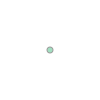

In [ ]:
NYC_selected_offenses.iloc[0]["point"].within()

In [ ]:
nyc_sex_crimes = NYC_selected_offenses[NYC_selected_offenses["OFNS_DESC"]=="SEX CRIMES"]
len(nyc_sex_crimes.index)

5654

In [ ]:
nyc_sex_crimes.head()

,CMPLNT_NUM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,ADDR_PCT_CD,RPT_DT,KY_CD,OFNS_DESC,PD_CD,...,SUSP_SEX,TRANSIT_DISTRICT,Latitude,Longitude,Lat_Lon,PATROL_BORO,STATION_NAME,VIC_AGE_GROUP,VIC_RACE,VIC_SEX
684312,878676856,2021-11-09,17:10:00,11/09/2021,17:13:00,14.0,11/09/2021,116,SEX CRIMES,596.0,...,NaN,NaN,40.753939,-73.994844,"(40.75393893800003, -73.99484365499995)",PATROL BORO MAN SOUTH,NaN,<18,WHITE,F
686255,762701411,2021-12-09,12:00:00,NaN,NaN,60.0,12/11/2021,233,SEX CRIMES,175.0,...,NaN,NaN,40.576157,-73.975984,"(40.576157300000034, -73.97598379999994)",PATROL BORO BKLYN SOUTH,NaN,<18,WHITE,F
687829,998527259,2021-09-01,00:01:00,09/30/2021,23:59:00,40.0,10/17/2021,116,SEX CRIMES,168.0,...,M,NaN,40.810396,-73.925311,"(40.81039601900005, -73.92531074499993)",PATROL BORO BRONX,NaN,<18,UNKNOWN,M
687981,449103425,2021-10-08,05:50:00,10/08/2021,05:56:00,71.0,10/08/2021,233,SEX CRIMES,175.0,...,M,NaN,40.664527,-73.947739,"(40.66452749800004, -73.94773929099993)",PATROL BORO BKLYN SOUTH,NaN,45-64,BLACK,F
688539,468577605,2021-09-21,16:00:00,09/21/2021,19:00:00,41.0,09/24/2021,116,SEX CRIMES,177.0,...,F,NaN,40.791152,-73.884383,"(40.79115187800004, -73.88438275299995)",PATROL BORO BRONX,NaN,25-44,WHITE,F


In [ ]:
fig = px.density_mapbox(data_frame=nyc_sex_crimes, lat='Latitude', lon='Longitude', radius=5, mapbox_style='basic',zoom=10)
fig.update_layout(mapbox_style="carto-positron",height=800,width=800,title="Density of listings")
fig.show()


In [ ]:
fig = px.scatter_mapbox(data_frame=nyc_sex_crimes, lat='Latitude', lon='Longitude', mapbox_style='basic',zoom=10)
fig.update_layout(mapbox_style="carto-positron",height=800,width=800,title="Price map price")
fig.show()


In [ ]:
fig = px.scatter_mapbox(data_frame=NYC_selected_offenses[NYC_selected_offenses["OFNS_DESC"]=="RAPE"], lat='Latitude', lon='Longitude', color="OFNS_DESC", mapbox_style='basic',zoom=10)
fig.update_layout(mapbox_style="carto-positron",height=800,width=800,title="Price map price")
fig.show()


In [ ]:
fig = px.density_mapbox(data_frame=NYC_selected_offenses[NYC_selected_offenses["OFNS_DESC"]=="MURDER & NON-NEGL. MANSLAUGHTER"], lat='Latitude', lon='Longitude', radius=5, mapbox_style='basic',zoom=10)
fig.update_layout(mapbox_style="carto-positron",height=800,width=800,title="Density of murder and Non legal manslaughter")
fig.show()


In [ ]:
fig = px.choropleth_mapbox(data_frame=NYC_selected_offenses, 
                           geojson=jsonGeoNeigh, locations='neighbourhood_cleansed', color='OFNS_DESC', featureidkey='properties.neighbourhood', 
                           mapbox_style='basic',center={"lat": 40.7, "lon": -74},zoom=9.5)
fig.update_layout(mapbox_style="carto-positron",height=800,width=800,title="Average price per neighbourhood")
fig.show()


ValueError: Value of 'locations' is not the name of a column in 'data_frame'. Expected one of ['CMPLNT_NUM', 'CMPLNT_FR_DT', 'CMPLNT_FR_TM', 'CMPLNT_TO_DT', 'CMPLNT_TO_TM', 'ADDR_PCT_CD', 'RPT_DT', 'KY_CD', 'OFNS_DESC', 'PD_CD', 'PD_DESC', 'CRM_ATPT_CPTD_CD', 'LAW_CAT_CD', 'BORO_NM', 'LOC_OF_OCCUR_DESC', 'PREM_TYP_DESC', 'JURIS_DESC', 'JURISDICTION_CODE', 'PARKS_NM', 'HADEVELOPT', 'HOUSING_PSA', 'X_COORD_CD', 'Y_COORD_CD', 'SUSP_AGE_GROUP', 'SUSP_RACE', 'SUSP_SEX', 'TRANSIT_DISTRICT', 'Latitude', 'Longitude', 'Lat_Lon', 'PATROL_BORO', 'STATION_NAME', 'VIC_AGE_GROUP', 'VIC_RACE', 'VIC_SEX'] but received: neighbourhood_cleansed

In [ ]:
geosonNeighbourhoods = geopandas.read_file("../Data/neighbourhoods/neighbourhoods.geojson")
geosonNeighbourhoods

,neighbourhood,neighbourhood_group,geometry
0,Bayswater,Queens,"MULTIPOLYGON (((-73.76671 40.61491, -73.76825 ..."
1,Allerton,Bronx,"MULTIPOLYGON (((-73.84860 40.87167, -73.84582 ..."
2,City Island,Bronx,"MULTIPOLYGON (((-73.78282 40.84392, -73.78257 ..."
3,Ditmars Steinway,Queens,"MULTIPOLYGON (((-73.90160 40.76777, -73.90391 ..."
4,Ozone Park,Queens,"MULTIPOLYGON (((-73.83754 40.69136, -73.83108 ..."
...,...,...,...
228,Westchester Square,Bronx,"MULTIPOLYGON (((-73.84294 40.84640, -73.83913 ..."
229,Westerleigh,Staten Island,"MULTIPOLYGON (((-74.13131 40.62633, -74.13192 ..."
230,Williamsbridge,Bronx,"MULTIPOLYGON (((-73.86722 40.86969, -73.86701 ..."
231,Williamsburg,Brooklyn,"MULTIPOLYGON (((-73.95757 40.72510, -73.95300 ..."


In [ ]:
NYC_selected_offenses.head()

,CMPLNT_NUM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,ADDR_PCT_CD,RPT_DT,KY_CD,OFNS_DESC,PD_CD,...,SUSP_SEX,TRANSIT_DISTRICT,Latitude,Longitude,Lat_Lon,PATROL_BORO,STATION_NAME,VIC_AGE_GROUP,VIC_RACE,VIC_SEX
681150,123171799,2021-12-31,21:15:00,NaN,NaN,43.0,12/31/2021,106,FELONY ASSAULT,109.0,...,M,NaN,40.817877,-73.865994,"(40.81787660100008, -73.86599391299995)",PATROL BORO BRONX,NaN,65+,BLACK,M
681311,143012852,2021-12-26,20:30:00,NaN,NaN,50.0,12/27/2021,344,ASSAULT 3 & RELATED OFFENSES,101.0,...,M,NaN,40.896652,-73.880524,"(40.89665184000006, -73.88052425099994)",PATROL BORO BRONX,NaN,25-44,WHITE HISPANIC,F
681613,829808403,2021-12-26,20:25:00,12/26/2021,20:57:00,20.0,12/26/2021,118,DANGEROUS WEAPONS,792.0,...,M,NaN,40.774164,-73.984881,"(40.77416407000004, -73.984880805)",PATROL BORO MAN NORTH,NaN,UNKNOWN,UNKNOWN,E
681853,321336708,2021-12-06,17:00:00,NaN,NaN,25.0,12/07/2021,351,CRIMINAL MISCHIEF & RELATED OF,258.0,...,NaN,NaN,40.798635,-73.939522,"(40.79863496300004, -73.93952191599993)",PATROL BORO MAN NORTH,NaN,UNKNOWN,UNKNOWN,E
681875,246003700,2021-12-08,11:20:00,12/08/2021,11:30:00,1.0,12/08/2021,344,ASSAULT 3 & RELATED OFFENSES,101.0,...,F,NaN,40.709532,-74.001668,"(40.70953164600007, -74.00166786599993)",PATROL BORO MAN SOUTH,NaN,25-44,WHITE,M


In [ ]:
#from shapely.geometry import Point
geo_df=geopandas.GeoDataFrame(NYC_selected_offenses,geometry= geopandas.points_from_xy(NYC_selected_offenses["Latitude"],NYC_selected_offenses["Longitude"]))
geo_df.head()

,CMPLNT_NUM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,ADDR_PCT_CD,RPT_DT,KY_CD,OFNS_DESC,PD_CD,...,TRANSIT_DISTRICT,Latitude,Longitude,Lat_Lon,PATROL_BORO,STATION_NAME,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,geometry
681150,123171799,2021-12-31,21:15:00,NaN,NaN,43.0,12/31/2021,106,FELONY ASSAULT,109.0,...,NaN,40.817877,-73.865994,"(40.81787660100008, -73.86599391299995)",PATROL BORO BRONX,NaN,65+,BLACK,M,POINT (40.81788 -73.86599)
681311,143012852,2021-12-26,20:30:00,NaN,NaN,50.0,12/27/2021,344,ASSAULT 3 & RELATED OFFENSES,101.0,...,NaN,40.896652,-73.880524,"(40.89665184000006, -73.88052425099994)",PATROL BORO BRONX,NaN,25-44,WHITE HISPANIC,F,POINT (40.89665 -73.88052)
681613,829808403,2021-12-26,20:25:00,12/26/2021,20:57:00,20.0,12/26/2021,118,DANGEROUS WEAPONS,792.0,...,NaN,40.774164,-73.984881,"(40.77416407000004, -73.984880805)",PATROL BORO MAN NORTH,NaN,UNKNOWN,UNKNOWN,E,POINT (40.77416 -73.98488)
681853,321336708,2021-12-06,17:00:00,NaN,NaN,25.0,12/07/2021,351,CRIMINAL MISCHIEF & RELATED OF,258.0,...,NaN,40.798635,-73.939522,"(40.79863496300004, -73.93952191599993)",PATROL BORO MAN NORTH,NaN,UNKNOWN,UNKNOWN,E,POINT (40.79863 -73.93952)
681875,246003700,2021-12-08,11:20:00,12/08/2021,11:30:00,1.0,12/08/2021,344,ASSAULT 3 & RELATED OFFENSES,101.0,...,NaN,40.709532,-74.001668,"(40.70953164600007, -74.00166786599993)",PATROL BORO MAN SOUTH,NaN,25-44,WHITE,M,POINT (40.70953 -74.00167)


In [ ]:
NYC_selected_offenses["point"] = geopandas.points_from_xy(NYC_selected_offenses["Latitude"],NYC_selected_offenses["Longitude"])

In [ ]:
NYC_selected_offenses.head()

,CMPLNT_NUM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,ADDR_PCT_CD,RPT_DT,KY_CD,OFNS_DESC,PD_CD,...,Latitude,Longitude,Lat_Lon,PATROL_BORO,STATION_NAME,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,geometry,point
681150,123171799,2021-12-31,21:15:00,NaN,NaN,43.0,12/31/2021,106,FELONY ASSAULT,109.0,...,40.817877,-73.865994,"(40.81787660100008, -73.86599391299995)",PATROL BORO BRONX,NaN,65+,BLACK,M,POINT (40.81788 -73.86599),POINT (40.81788 -73.86599)
681311,143012852,2021-12-26,20:30:00,NaN,NaN,50.0,12/27/2021,344,ASSAULT 3 & RELATED OFFENSES,101.0,...,40.896652,-73.880524,"(40.89665184000006, -73.88052425099994)",PATROL BORO BRONX,NaN,25-44,WHITE HISPANIC,F,POINT (40.89665 -73.88052),POINT (40.89665 -73.88052)
681613,829808403,2021-12-26,20:25:00,12/26/2021,20:57:00,20.0,12/26/2021,118,DANGEROUS WEAPONS,792.0,...,40.774164,-73.984881,"(40.77416407000004, -73.984880805)",PATROL BORO MAN NORTH,NaN,UNKNOWN,UNKNOWN,E,POINT (40.77416 -73.98488),POINT (40.77416 -73.98488)
681853,321336708,2021-12-06,17:00:00,NaN,NaN,25.0,12/07/2021,351,CRIMINAL MISCHIEF & RELATED OF,258.0,...,40.798635,-73.939522,"(40.79863496300004, -73.93952191599993)",PATROL BORO MAN NORTH,NaN,UNKNOWN,UNKNOWN,E,POINT (40.79863 -73.93952),POINT (40.79863 -73.93952)
681875,246003700,2021-12-08,11:20:00,12/08/2021,11:30:00,1.0,12/08/2021,344,ASSAULT 3 & RELATED OFFENSES,101.0,...,40.709532,-74.001668,"(40.70953164600007, -74.00166786599993)",PATROL BORO MAN SOUTH,NaN,25-44,WHITE,M,POINT (40.70953 -74.00167),POINT (40.70953 -74.00167)


In [ ]:
neighbourhoods_list = []
i=0
for row_df in NYC_selected_offenses.iterrows():
    for row_geo in geosonNeighbourhoods.iterrows():     
        #print(row_geo)
        if row_geo[1].contains(row_geo.geometry):
            neighbourhoods_list.append(row_geo.neighbourhood)
    
neighbourhoods_list

AttributeError: 'Series' object has no attribute 'contains'

In [ ]:
geo_df["neighbourhood"] = row_geo.neighbourhood for row_df in geo_df for row_geo in geosonNeighbourhoods if row_geo.contains(row_df.geometry)

SyntaxError: invalid syntax (Temp/ipykernel_30416/4272777398.py, line 1)

In [ ]:
geosonNeighbourhoods[geosonNeighbourhoods["geometry"].contains(point)==False]

,neighbourhood,neighbourhood_group,geometry
0,Bayswater,Queens,"MULTIPOLYGON (((-73.76671 40.61491, -73.76825 ..."
1,Allerton,Bronx,"MULTIPOLYGON (((-73.84860 40.87167, -73.84582 ..."
2,City Island,Bronx,"MULTIPOLYGON (((-73.78282 40.84392, -73.78257 ..."
3,Ditmars Steinway,Queens,"MULTIPOLYGON (((-73.90160 40.76777, -73.90391 ..."
4,Ozone Park,Queens,"MULTIPOLYGON (((-73.83754 40.69136, -73.83108 ..."
...,...,...,...
228,Westchester Square,Bronx,"MULTIPOLYGON (((-73.84294 40.84640, -73.83913 ..."
229,Westerleigh,Staten Island,"MULTIPOLYGON (((-74.13131 40.62633, -74.13192 ..."
230,Williamsbridge,Bronx,"MULTIPOLYGON (((-73.86722 40.86969, -73.86701 ..."
231,Williamsburg,Brooklyn,"MULTIPOLYGON (((-73.95757 40.72510, -73.95300 ..."


In [ ]:
fig = px.density_mapbox(data_frame=NYC_selected_offenses[NYC_selected_offenses["OFNS_DESC"]=="ASSAULT 3 & RELATED OFFENSES"], lat='Latitude', lon='Longitude', radius=5, mapbox_style='basic',zoom=10)
fig.update_layout(mapbox_style="carto-positron",height=800,width=800,title="Density of assault")
fig.show()
